# WaterMeter - François Goujon

In [1]:
import matplotlib.pyplot as plt
import keras_ocr
import cv2 
import numpy as np
import os
import time
import math
import imgaug
import sklearn.model_selection
import tensorflow as tf

## Test du pipeline (detector et recognizer) sur quelques images

In [2]:
IMG_DIR = 'pictures/'

def bgrToRgb(image):
    b,g,r = cv2.split(image)
    rgb_img = cv2.merge([r,g,b])
    return rgb_img

In [3]:
image1 = bgrToRgb(cv2.imread(IMG_DIR + '1ec531.jpg'))
image2 = bgrToRgb(cv2.imread(IMG_DIR + '6a09b5.jpg'))
image3 = bgrToRgb(cv2.imread(IMG_DIR + '7ce3d4.jpg'))
image4 = bgrToRgb(cv2.imread(IMG_DIR + '8bf080.jpg'))

Looking for /Users/francoisgoujon/.keras-ocr/craft_mlt_25k.h5
Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Looking for /Users/francoisgoujon/.keras-ocr/crnn_kurapan.h5


/Users/francoisgoujon/miniconda/envs/gti771/lib/python3.8/site-packages/keras_ocr/tools.py:156: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  ax.annotate(s=text,


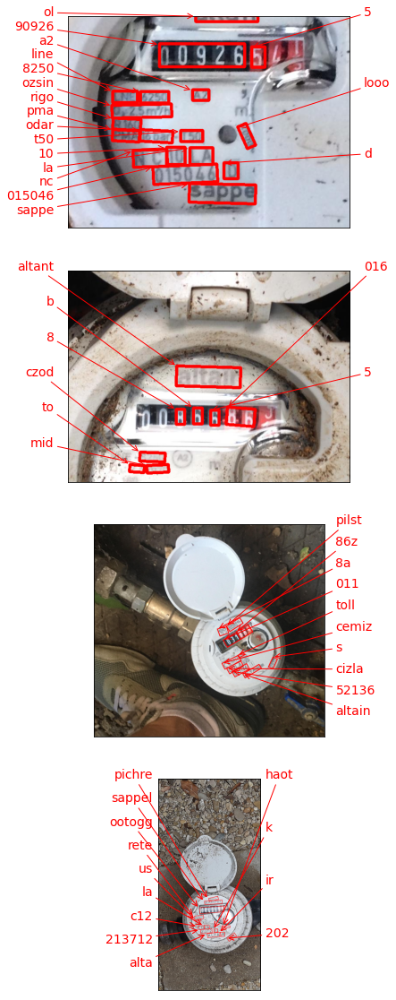

In [4]:
pipeline = keras_ocr.pipeline.Pipeline()

images = [image1, image2, image3, image4]

# Each list of predictions in prediction_groups is a list of
# (word, box) tuples.
prediction_groups = pipeline.recognize(images)

# Plot the predictions
fig, axs = plt.subplots(nrows=len(images), figsize=(20, 20))
for ax, image, predictions in zip(axs, images, prediction_groups):
    keras_ocr.tools.drawAnnotations(image=image, predictions=predictions, ax=ax)

#### Le modele trouve bien des zones de texte mais avec les images tels quelles non réduites cela n'est pas efficace. On va donc utiliser les ROI trouvées avec le modele YOLO.

## Avec les ROI 

In [5]:
dataval = np.load('Data/listeinterval.npy', allow_pickle=True)
datatrain = np.load('Data/listeintertrain.npy', allow_pickle=True)

In [6]:
def datatoimg(data):
    X = []
    for i in range(len(data)):
        img = data[i,0]
        img = img *255
        img = img.astype(np.uint8)
        img = bgrToRgb(img)
        X.append(img)
    X = np.array(X)
    return X

In [7]:
# ROI des images du set val et train
val = datatoimg(dataval)
train = datatoimg(datatrain)

<ipython-input-6-20ed2c3673e4>:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  X = np.array(X)


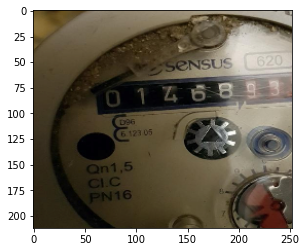

In [8]:
plt.imshow(val[0])
plt.show()

In [17]:
# permet de predire les images images avec le pipeline
# size_threshold permet de déterminer la taille minimale des bounding box valides
def pred(pipeline, images, size_threshold = None):
    taille = len(images)
    if size_threshold == None:
        prediction = pipeline.recognize(images)
    else:
        prediction = pipeline.recognize(images, detection_kwargs={"size_threshold": size_threshold})
    # Plot des predictions
    fig, axs = plt.subplots(nrows=len(images), figsize=(20, taille*5))
    for ax, image, predictions in zip(axs, images, prediction):
        keras_ocr.tools.drawAnnotations(image=image, predictions=predictions, ax=ax)
    return prediction

# à partir des predictions effectuées avec pred, permet de garder seulement celles avec des chiffres
def preddigits(pred, images):
    new_pred = []
    taille = len(pred)
    for i in range(taille):
        boxes = []
        for b in range(len(pred[i])):
            if pred[i][b][0].isdigit():
                boxes.append(pred[i][b])
        new_pred.append(boxes)
        
    fig, axs = plt.subplots(nrows=len(images), figsize=(20, taille*5))
    for ax, image, predictions in zip(axs, images, new_pred):
        keras_ocr.tools.drawAnnotations(image=image, predictions=predictions, ax=ax)
        
    return new_pred

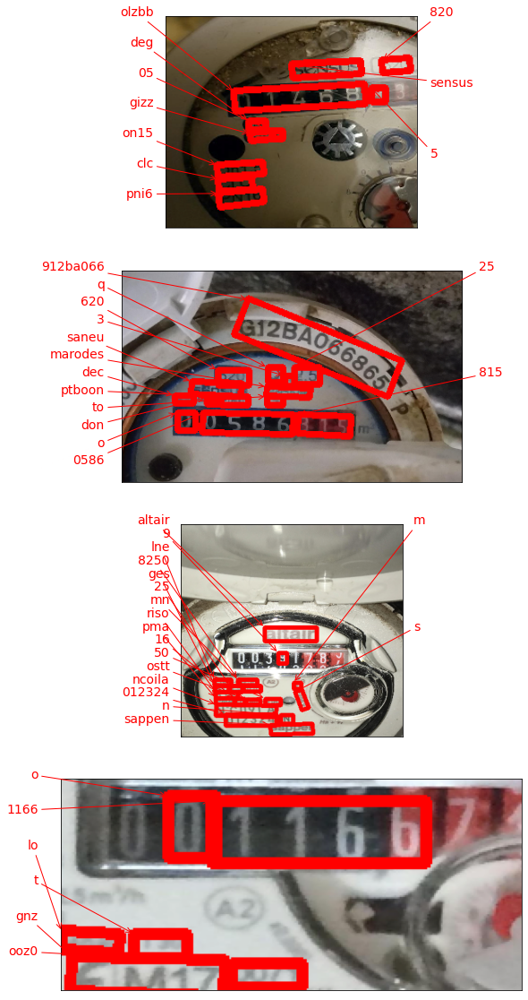

In [10]:
predval = pred(pipeline, val)

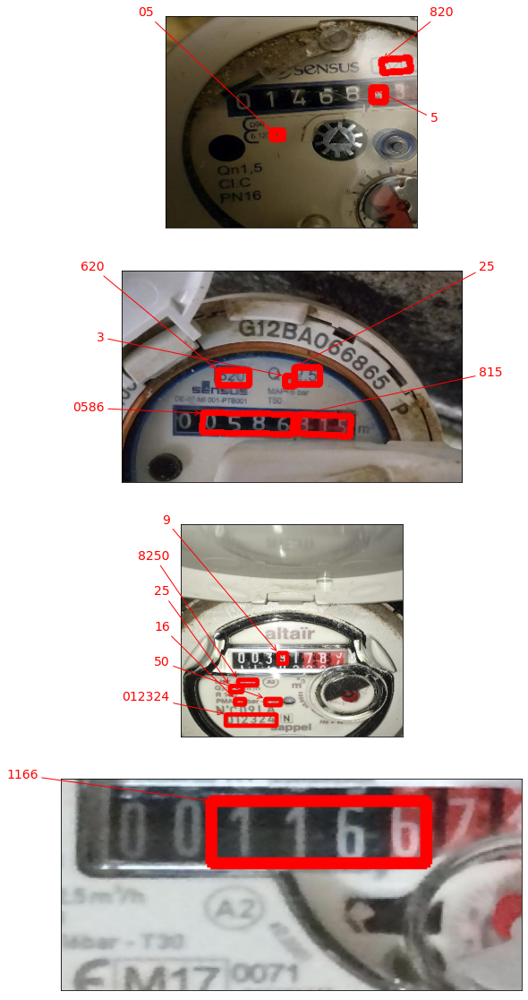

In [11]:
predvaldigit = preddigits(predval, val)

#### L'index est globalement bien détecté mais parfois mal lu (lettres au lieu de chiffres). La dernière photo donne un bon résultat cependant il faudrait un moyen d'enlever le 6 sur fond rouge.

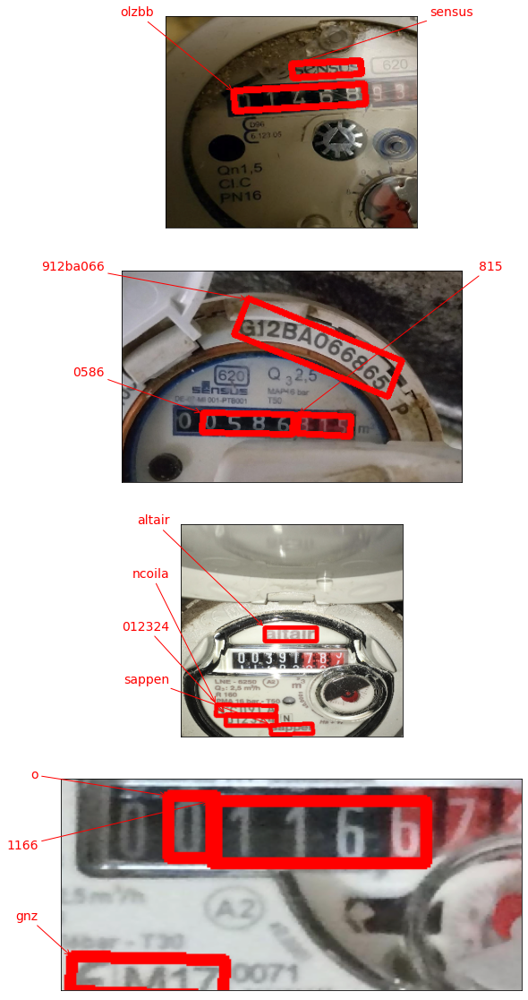

In [20]:
predvalbig = pred(pipeline, val, size_threshold=300)  # On ne garde que les grandes boites

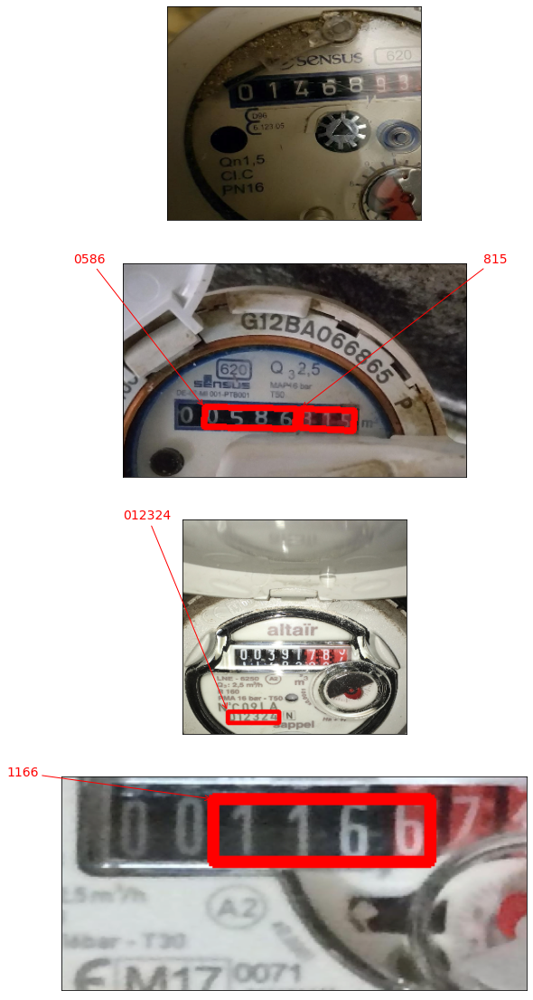

In [21]:
predvalbigdigit = preddigits(predvalbig, val)

## On a 2 bonnes lectures sur les 4 images, sur la 2eme les parties droites et gauches de l'index sont bien séparées.

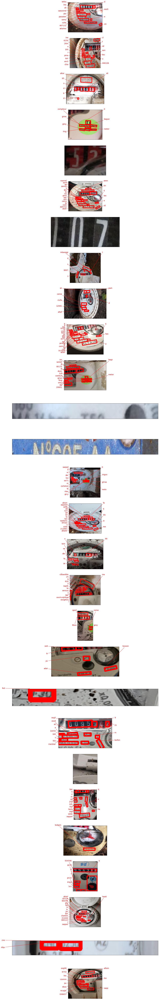

In [12]:
predtrain = pred(pipeline, train)

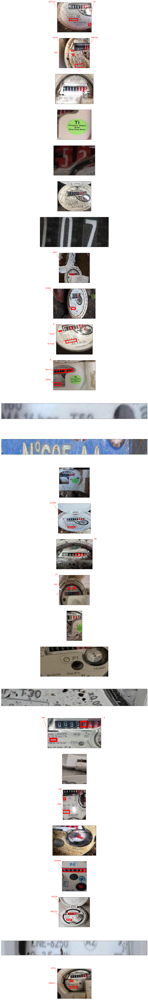

In [13]:
predtraindigit = preddigits(predtrain, train)

### On a quelques bonnes lectures mais le modèle est encore trop gêné par les écritures sur le compteur. Cela est principalement dû au fait que le modèle n'a pas été réentraîné sur nos données. Il est entraîné pour lire du texte et des nombres de toutes sortes sur des images ce qu'il fait bien ici, cependant on ne voudrait garder que l'index pour notre utilisation. Pour cela il faudrait ré-entraîner les 2 modèles du pipeline sur nos données.

Je ne vais pas effectuer cette étape car cela est un peu long mais la procédure complète est expliquée ici : https://github.com/faustomorales/keras-ocr/blob/master/docs/examples/end_to_end_training.rst

# Conclusion

Je n'arrive pas à des résultats encore réellement exploitables et il faudrait encore entraîner les modèles pour arriver à de bons résultats mais ceux-ci sembles sur la bonne voie. Je pense qu'en perfectionnant les différents modèles ce processus pourrait convenir.